In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix
import scikitplot as skplt

plt.rc('figure',figsize=(18,9))
%pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

Note: you may need to restart the kernel to use updated packages.


In [2]:
c_data = pd.read_csv("BANK CHURN ANALYSIS.csv")
c_data = c_data[c_data.columns[:-2]]
c_data.head(3)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333


In [3]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Customer_Age'],name='Age Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Customer_Age'],name='Age Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Customer Ages")
fig.show()

In [4]:
c_data.shape

(10127, 20)

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>We can see that the distribution of customer ages in our dataset follows a fairly normal distribution; thus, further use of the age feature can be done with the normality assumption.</span></p>

In [5]:
fig = make_subplots(
    rows=2, cols=2,subplot_titles=('','<b>Platinum Card Holders','<b>Blue Card Holders<b>','Residuals'),
    vertical_spacing=0.09,
    specs=[[{"type": "pie","rowspan": 2}       ,{"type": "pie"}] ,
           [None                               ,{"type": "pie"}]            ,                                      
          ]
)

fig.add_trace(
    go.Pie(values=c_data.Gender.value_counts().values,labels=['<b>Female<b>','<b>Male<b>'],hole=0.3,pull=[0,0.3]),
    row=1, col=1
)

fig.add_trace(
    go.Pie(
        labels=['Female Platinum Card Holders','Male Platinum Card Holders'],
        values=c_data.query('Card_Category=="Platinum"').Gender.value_counts().values,
        pull=[0,0.05,0.5],
        hole=0.3
        
    ),
    row=1, col=2
)

fig.add_trace(
    go.Pie(
        labels=['Female Blue Card Holders','Male Blue Card Holders'],
        values=c_data.query('Card_Category=="Blue"').Gender.value_counts().values,
        pull=[0,0.2,0.5],
        hole=0.3
    ),
    row=2, col=2
)



fig.update_layout(
    height=800,
    showlegend=True,
    title_text="<b>Distribution Of Gender And Different Card Statuses<b>",
)

fig.show()

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>More samples of females in our dataset are compared to males, but the percentage of difference is not that significant, so we can say that genders are uniformly distributed.</span></p>

In [6]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Dependent_count'],name='Dependent count Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Dependent_count'],name='Dependent count Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Dependent counts (close family size)")
fig.show()

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>The distribution of Dependent counts is fairly normally distributed with a slight right skew.</span></p>

In [7]:
ex.pie(c_data,names='Education_Level',title='Propotion Of Education Levels',hole=0.33)

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>If most of the customers with unknown education status lack any education, we can state that more than 70% of the customers have a formal education level. About 35% have a higher level of education.</span></p>

In [8]:
ex.pie(c_data,names='Marital_Status',title='Propotion Of Different Marriage Statuses',hole=0.33)


<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>Almost half of the bank customers are married, and interestingly enough, almost the entire other half are single customers. only about 7% of the customers are divorced, which is surprising considering the worldwide divorce rate statistics! (let me know where the bank is located and sign me up!)</span></p>

In [9]:
ex.pie(c_data,names='Income_Category',title='Propotion Of Different Income Levels',hole=0.33)

In [10]:
ex.pie(c_data,names='Card_Category',title='Propotion Of Different Card Categories',hole=0.33)

In [11]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Months_on_book'],name='Months on book Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Months_on_book'],name='Months on book Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of months the customer is part of the bank")
fig.show()

In [12]:
print('Kurtosis of Months on book features is : {}'.format(c_data['Months_on_book'].kurt()))

Kurtosis of Months on book features is : 0.40010012019986707


<p style="text-align: center;"><span style='font-size: 24px; font-family: "Times New Roman", Times, serif;'>We have a low kurtosis value pointing to a very flat shaped distribution (as shown in the plots above as well), meaning we cannot assume normality of the feature.</span></p>

In [13]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Total_Relationship_Count'],name='Total no. of products Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Total_Relationship_Count'],name='Total no. of products Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Total no. of products held by the customer")
fig.show()

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>The distribution of the total number of products held by the customer seems closer to a uniform distribution and may appear useless as a predictor for churn status.</span></p>

In [14]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Months_Inactive_12_mon'],name='number of months inactive Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Months_Inactive_12_mon'],name='number of months inactive Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the number of months inactive in the last 12 months")
fig.show()

In [15]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Credit_Limit'],name='Credit_Limit Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Credit_Limit'],name='Credit_Limit Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the Credit Limit")
fig.show()

In [16]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Total_Trans_Amt'],name='Total_Trans_Amt Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Total_Trans_Amt'],name='Total_Trans_Amt Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the Total Transaction Amount (Last 12 months)")
fig.show()

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>We see that the distribution of the total transactions (Last 12 months) displays a multimodal distribution, meaning we have some underlying groups in our data; it can be an interesting experiment to try and cluster the different groups and view the similarities between them and what describes best the different groups which create the different modes in our distribution.</span></p>

In [17]:
ex.pie(c_data,names='Attrition_Flag',title='Proportion of churn vs not churn customers',hole=0.33)

<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>As we can see, only 16% of the data samples represent churn customers; in the following steps, I will use SMOTE to upsample the churn samples to match them with the regular customer sample size to give the later selected models a better chance of catching on small details which will almost definitely be missed out with such a size difference.</span></p>

In [18]:
c_data

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722


In [ ]:
c_data.Attrition_Flag = c_data.Attrition_Flag.replace({'Attrited Customer':1,'Existing Customer':0})
c_data.Gender = c_data.Gender.replace({'F':1,'M':0})
c_data = pd.concat([c_data,pd.get_dummies(c_data['Education_Level']).drop(columns=['Unknown'])],axis=1)
c_data = pd.concat([c_data,pd.get_dummies(c_data['Income_Category']).drop(columns=['Unknown'])],axis=1)
c_data = pd.concat([c_data,pd.get_dummies(c_data['Marital_Status']).drop(columns=['Unknown'])],axis=1)
c_data = pd.concat([c_data,pd.get_dummies(c_data['Card_Category']).drop(columns=['Platinum'])],axis=1)
c_data.drop(columns = ['Education_Level','Income_Category','Marital_Status','Card_Category','CLIENTNUM'],inplace=True)

In [47]:
c_data

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,$40K - $60K,$60K - $80K,$80K - $120K,Less than $40K,Divorced,Married,Single,Blue,Gold,Silver
0,0,45,0,3,39,5,1,3,12691.0,777,...,0,1,0,0,0,1,0,1,0,0
1,0,49,1,5,44,6,1,2,8256.0,864,...,0,0,0,1,0,0,1,1,0,0
2,0,51,0,3,36,4,1,0,3418.0,0,...,0,0,1,0,0,1,0,1,0,0
3,0,40,1,4,34,3,4,1,3313.0,2517,...,0,0,0,1,0,0,0,1,0,0
4,0,40,0,3,21,5,1,0,4716.0,0,...,0,1,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,0,2,40,3,2,3,4003.0,1851,...,1,0,0,0,0,0,1,1,0,0
10123,1,41,0,2,25,4,2,3,4277.0,2186,...,1,0,0,0,1,0,0,1,0,0
10124,1,44,1,1,36,5,3,4,5409.0,0,...,0,0,0,1,0,1,0,1,0,0
10125,1,30,0,2,36,4,3,3,5281.0,0,...,1,0,0,0,0,0,0,1,0,0


<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>Here we one hot encode all the categorical features describing different statuses of a customer.</span></p>

In [21]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =c_data.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),
    row=1, col=1
)


s_val =c_data.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=0.7,ygap=0.7,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Numeric Correaltions")
fig.show()

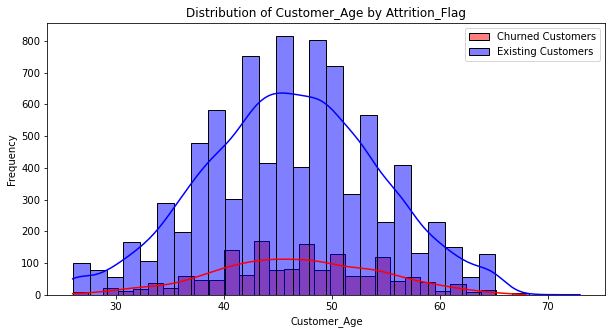

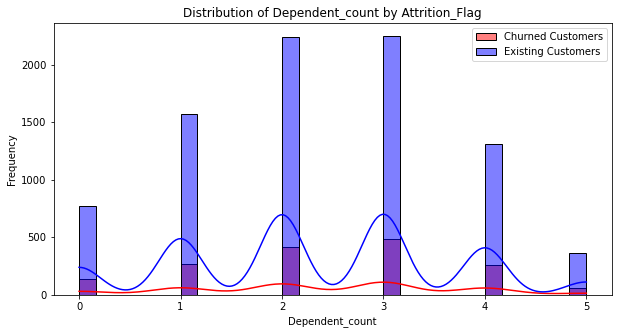

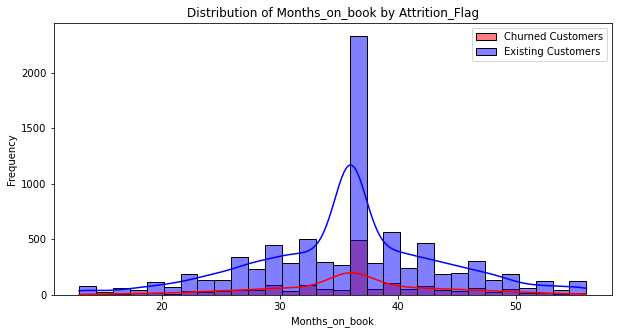

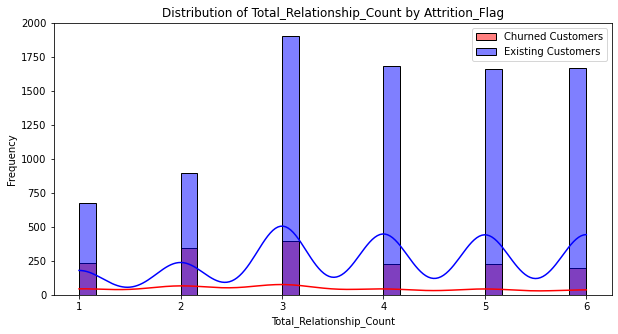

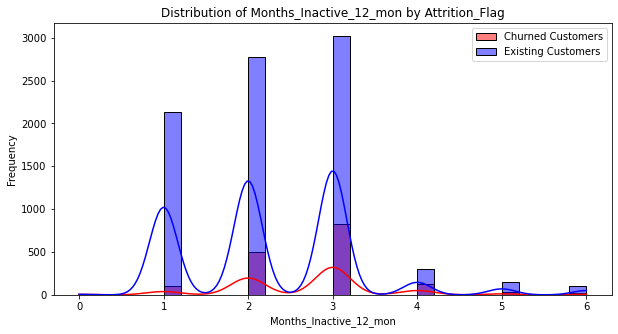

...

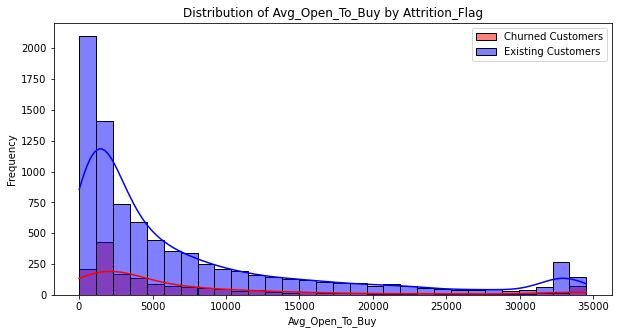

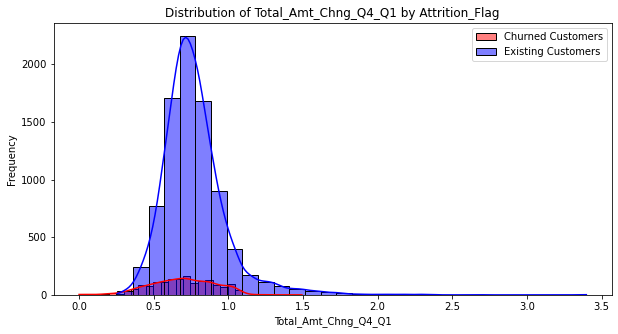

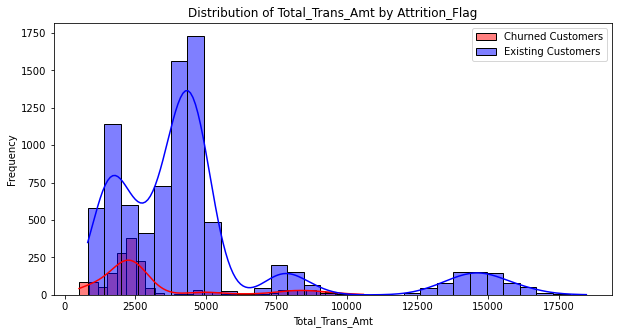

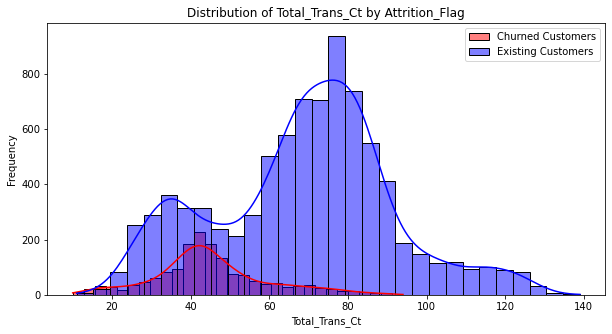

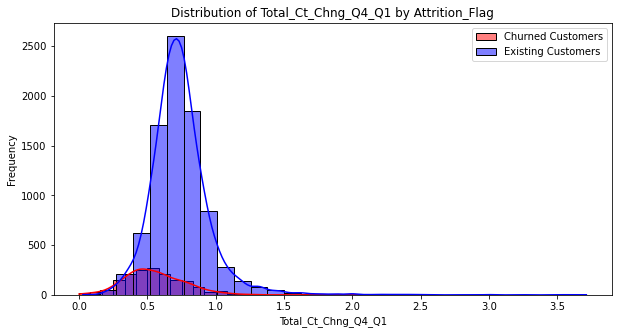

In [1]:
data = pd.read_csv('BANK CHURN ANALYSIS.csv')
churned_customers = data[data['Attrition_Flag'] == 'Attrited Customer']
existing_customers = data[data['Attrition_Flag'] == 'Existing Customer']

numeric_features = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

for feature in numeric_features:
    plt.figure(figsize=(10, 5))
    sns.histplot(churned_customers[feature], bins=30, color='red', label='Churned Customers', kde=True)
    sns.histplot(existing_customers[feature], bins=30, color='blue', label='Existing Customers', kde=True)
    plt.title(f'Distribution of {feature} by Attrition_Flag')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

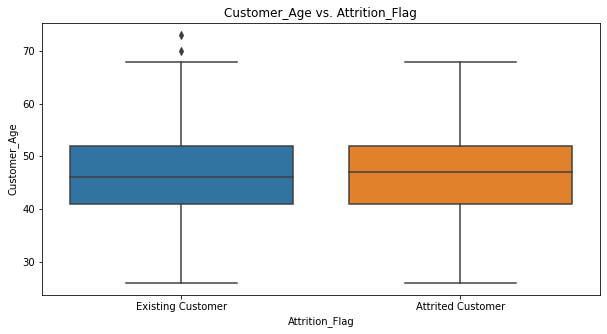

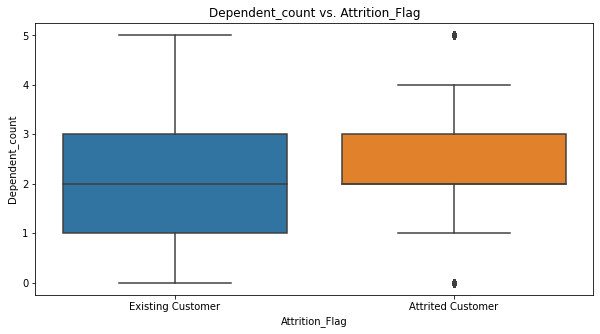

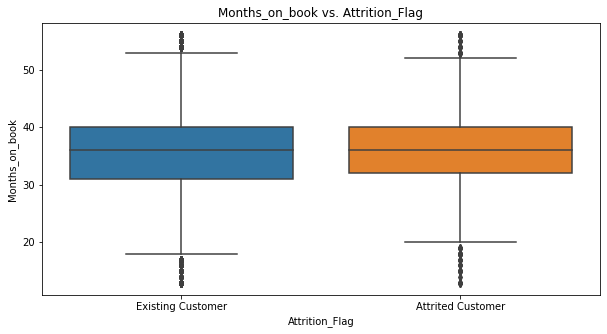

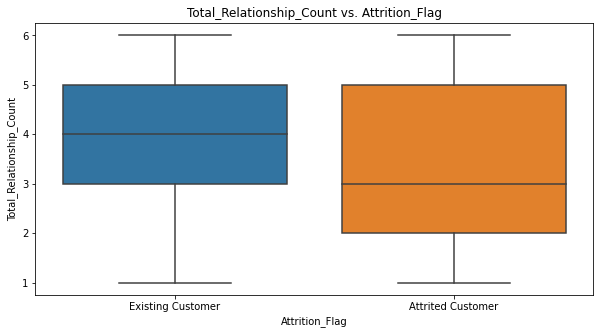

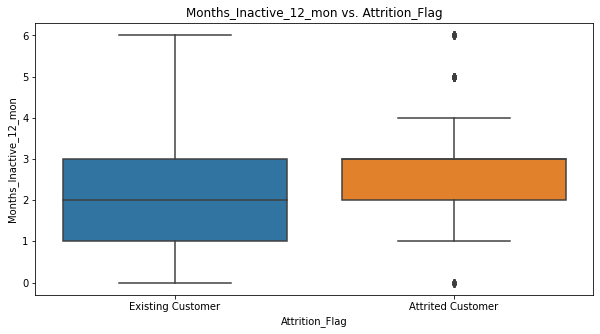

...

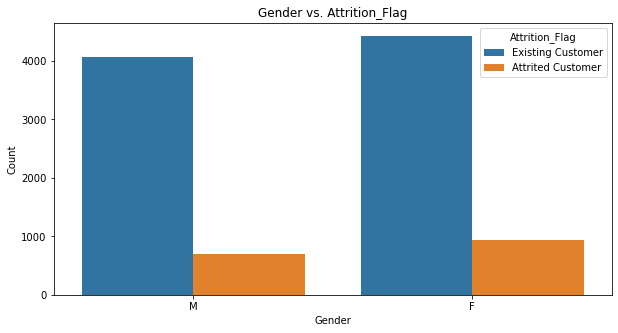

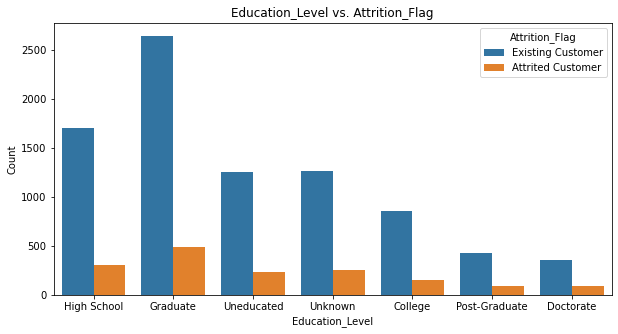

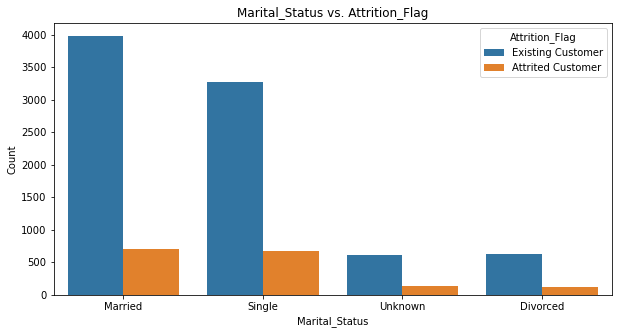

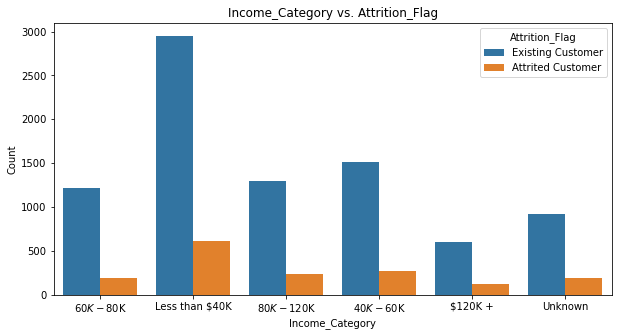

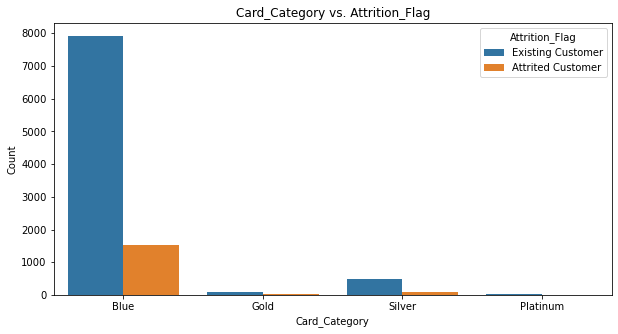

In [4]:

data = pd.read_csv("BANK CHURN ANALYSIS.csv")

categorical_features = ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
numeric_features = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

for feature in numeric_features:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='Attrition_Flag', y=feature, data=data)
    plt.title(f'{feature} vs. Attrition_Flag')
    plt.xlabel('Attrition_Flag')
    plt.ylabel(feature)
    plt.show()

for feature in categorical_features:
    plt.figure(figsize=(10, 5))
    sns.countplot(x=feature, hue='Attrition_Flag', data=data)
    plt.title(f'{feature} vs. Attrition_Flag')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.legend(title='Attrition_Flag')
    plt.show()


                           Feature  Importance
10                 Total_Trans_Amt    0.183683
11                  Total_Trans_Ct    0.180040
7              Total_Revolving_Bal    0.122376
12             Total_Ct_Chng_Q4_Q1    0.108399
9             Total_Amt_Chng_Q4_Q1    0.066746
3         Total_Relationship_Count    0.062266
6                     Credit_Limit    0.039568
8                  Avg_Open_To_Buy    0.035926
0                     Customer_Age    0.034708
5            Contacts_Count_12_mon    0.028007
4           Months_Inactive_12_mon    0.026616
2                   Months_on_book    0.026216
1                  Dependent_count    0.013588
14                        Gender_M    0.008186
23          Marital_Status_Married    0.006589
13                        Gender_F    0.006304
24           Marital_Status_Single    0.005034
17        Education_Level_Graduate    0.004172
30  Income_Category_Less than $40K    0.003744
18     Education_Level_High School    0.003372
29    Income_

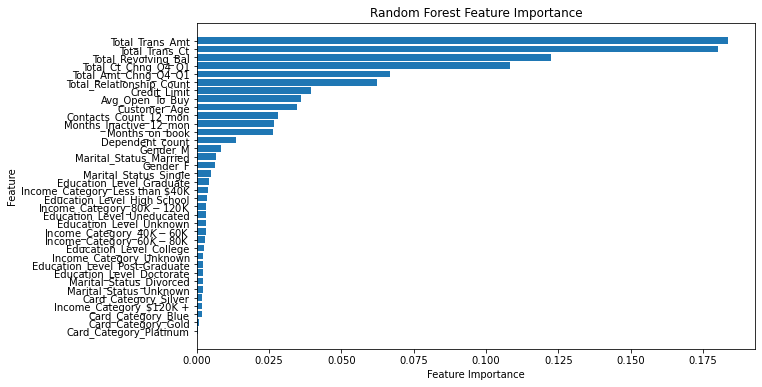

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

data = pd.read_csv("BANK CHURN ANALYSIS.csv")

numeric_features = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

categorical_features = ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

X = data.drop('Attrition_Flag', axis=1)
y = data['Attrition_Flag']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric_features),
        ('cat', OneHotEncoder(), categorical_features)
    ])

rf_classifier = RandomForestClassifier(random_state=42)

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', rf_classifier)
])

pipeline.fit(X, y)

feature_importances = pipeline.named_steps['classifier'].feature_importances_

feature_names = numeric_features + list(pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features))
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print(feature_importance_df)


plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importance')
plt.gca().invert_yaxis()  
plt.show()


In [6]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer

data = pd.read_csv("BANK CHURN ANALYSIS.csv")

X = data.drop('Attrition_Flag', axis=1)
y = data['Attrition_Flag']

categorical_features = ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
X = pd.get_dummies(X, columns=categorical_features, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)


selected_features = []

feature_importances = []

while X_train_imputed.shape[1] > 0:
   
    rf_classifier = RandomForestClassifier(random_state=42)
   
    rf_classifier.fit(X_train_imputed, y_train)
  
    y_pred = rf_classifier.predict(X_test_imputed)
    
    accuracy = accuracy_score(y_test, y_pred)
    
    feature_importances.append(accuracy)

    importances = rf_classifier.feature_importances_
    
    most_important_feature_index = np.argmax(importances)
 
    selected_feature_name = X.columns[most_important_feature_index]
    selected_features.append(selected_feature_name)

    X_train_imputed = np.delete(X_train_imputed, most_important_feature_index, axis=1)
    X_test_imputed = np.delete(X_test_imputed, most_important_feature_index, axis=1)
    
    X = X.drop(selected_feature_name, axis=1)

for feature, importance in zip(selected_features, feature_importances):
    print(f"Selected Feature: {feature}, Accuracy: {importance:.4f}")


C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\impute\_base.py:555: UserWarning: Skipping features without any observed values: ['Unnamed: 21']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\impute\_base.py:555: UserWarning: Skipping features without any observed values: ['Unnamed: 21']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


Selected Feature: Total_Trans_Amt, Accuracy: 0.9523
Selected Feature: Total_Trans_Ct, Accuracy: 0.9260
Selected Feature: Total_Ct_Chng_Q4_Q1, Accuracy: 0.9019
Selected Feature: Total_Revolving_Bal, Accuracy: 0.8799
Selected Feature: Avg_Utilization_Ratio, Accuracy: 0.8759
Selected Feature: Total_Amt_Chng_Q4_Q1, Accuracy: 0.8717
Selected Feature: Avg_Open_To_Buy, Accuracy: 0.8615
Selected Feature: Credit_Limit, Accuracy: 0.8569
Selected Feature: CLIENTNUM, Accuracy: 0.8546
Selected Feature: Customer_Age, Accuracy: 0.8526
Selected Feature: Months_on_book, Accuracy: 0.8496
Selected Feature: Contacts_Count_12_mon, Accuracy: 0.8319
Selected Feature: Dependent_count, Accuracy: 0.8065
Selected Feature: Total_Relationship_Count, Accuracy: 0.8131
Selected Feature: Months_Inactive_12_mon, Accuracy: 0.8236
Selected Feature: Card_Category_Platinum, Accuracy: 0.8289
Selected Feature: Marital_Status_Married, Accuracy: 0.8338
Selected Feature: Education_Level_Unknown, Accuracy: 0.8348
Selected Featur

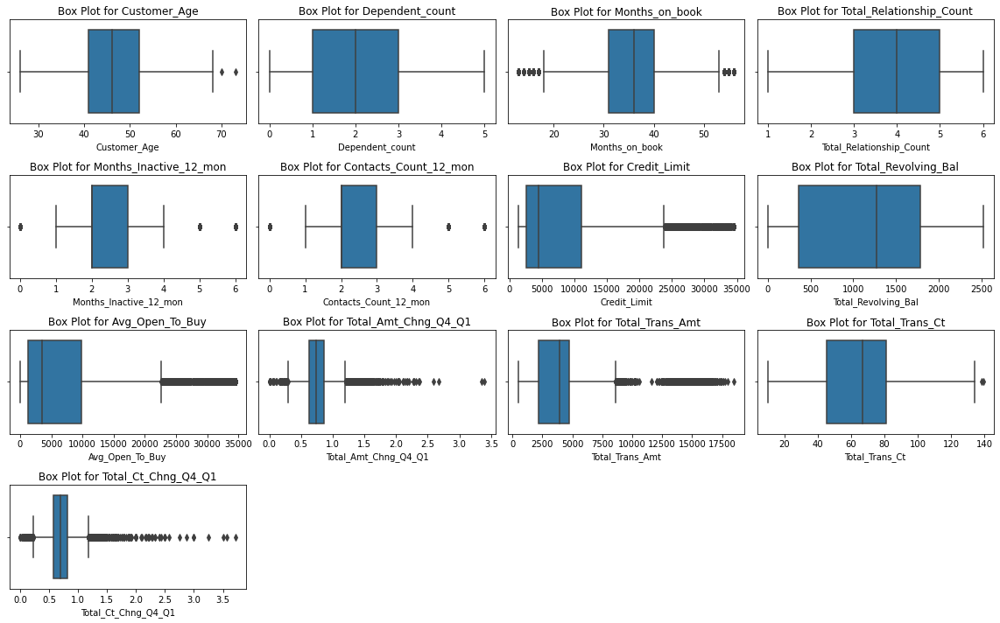

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


data = pd.read_csv('BANK CHURN ANALYSIS.csv')

numerical_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
                     'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
                     'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

plt.figure(figsize=(16, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=data[column])
    plt.title(f'Box Plot for {column}')

plt.tight_layout()
plt.show()


In [8]:
import pandas as pd


data = pd.read_csv('BANK CHURN ANALYSIS.csv')


numerical_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
                     'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
                     'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

outlier_counts = {}

for column in numerical_columns:
   
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    
  
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
   
    outliers_count = ((data[column] < lower_bound) | (data[column] > upper_bound)).sum()
    
   
    outlier_counts[column] = outliers_count

for column, count in outlier_counts.items():
    print(f'Column: {column}, Outliers Count: {count}')


Column: Customer_Age, Outliers Count: 2
Column: Dependent_count, Outliers Count: 0
Column: Months_on_book, Outliers Count: 386
Column: Total_Relationship_Count, Outliers Count: 0
Column: Months_Inactive_12_mon, Outliers Count: 331
Column: Contacts_Count_12_mon, Outliers Count: 629
Column: Credit_Limit, Outliers Count: 984
Column: Total_Revolving_Bal, Outliers Count: 0
Column: Avg_Open_To_Buy, Outliers Count: 963
Column: Total_Amt_Chng_Q4_Q1, Outliers Count: 396
Column: Total_Trans_Amt, Outliers Count: 896
Column: Total_Trans_Ct, Outliers Count: 2
Column: Total_Ct_Chng_Q4_Q1, Outliers Count: 394


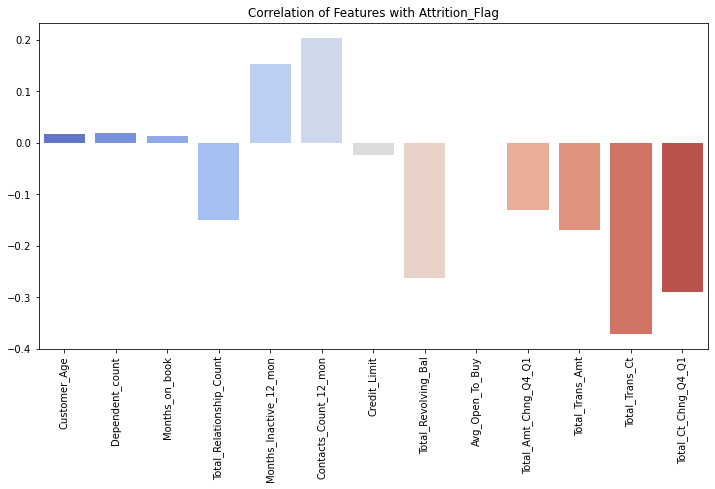

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.read_csv('BANK CHURN ANALYSIS.csv')


df['Attrition_Flag'] = df['Attrition_Flag'].map({'Attrited Customer': 1, 'Existing Customer': 0})

numerical_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count',
                     'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
                     'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
                     'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']


correlations = df[numerical_columns].corrwith(df['Attrition_Flag'])


plt.figure(figsize=(12, 6))
sns.barplot(x=correlations.index, y=correlations.values, palette='coolwarm')
plt.title('Correlation of Features with Attrition_Flag')
plt.xticks(rotation=90) 
plt.show()


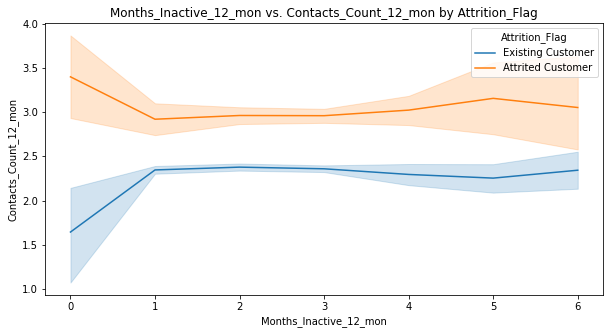

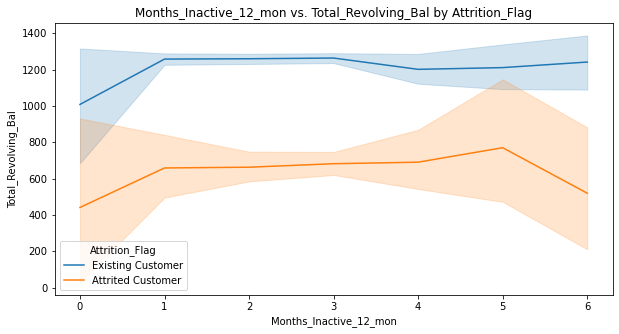

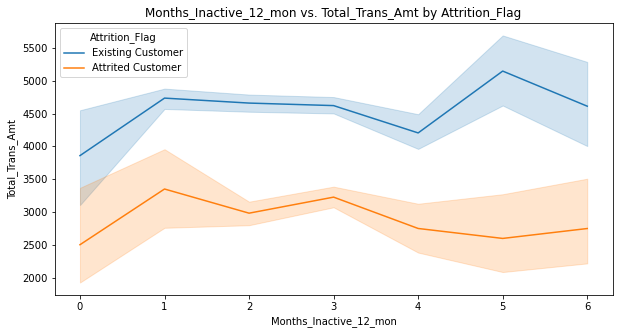

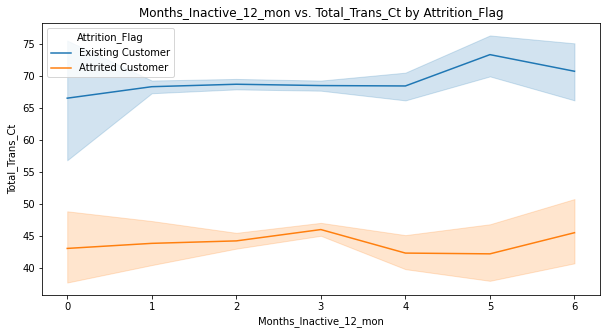

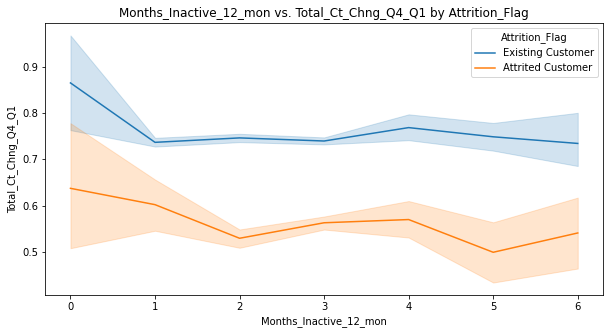

...

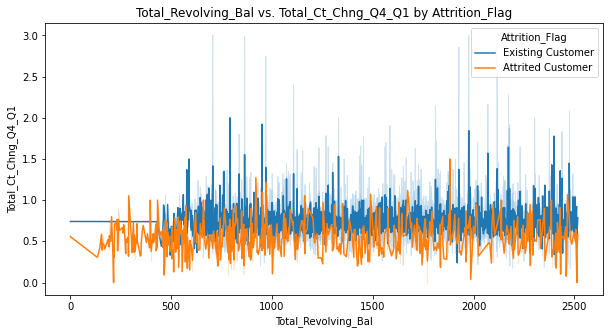

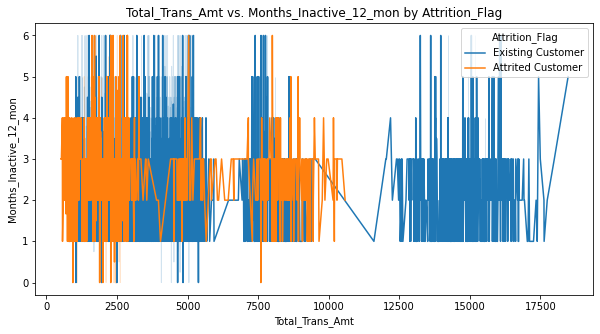

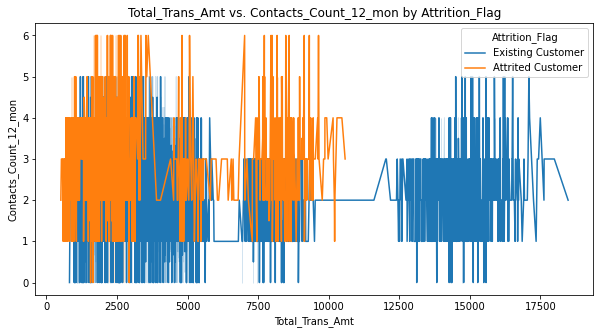

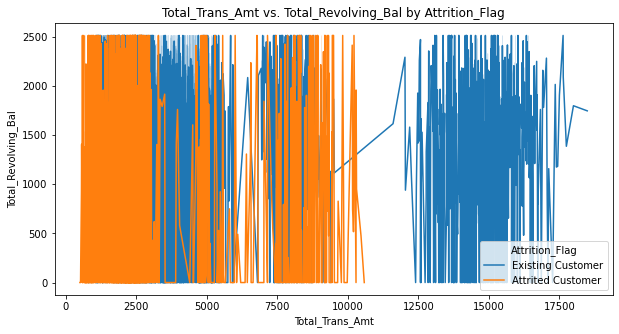

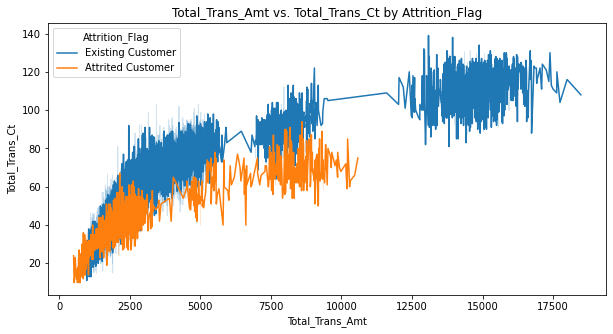

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv("BANK CHURN ANALYSIS.csv")


numeric_features = [ 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 
                    'Total_Revolving_Bal',   
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']


for feature1 in numeric_features:
    for feature2 in numeric_features:
        if feature1 != feature2:
            plt.figure(figsize=(10, 5))
          
            sns.lineplot(x=feature1, y=feature2, hue='Attrition_Flag', data=data)
            
            
            
            plt.title(f'{feature1} vs. {feature2} by Attrition_Flag')
            plt.xlabel(feature1)
            plt.ylabel(feature2)
            plt.legend(title='Attrition_Flag')
            plt.show()


PC1: 17.72% explained variance
PC2: 14.42% explained variance
PC3: 13.40% explained variance
PC4: 10.91% explained variance
PC5: 7.89% explained variance
PC6: 7.65% explained variance


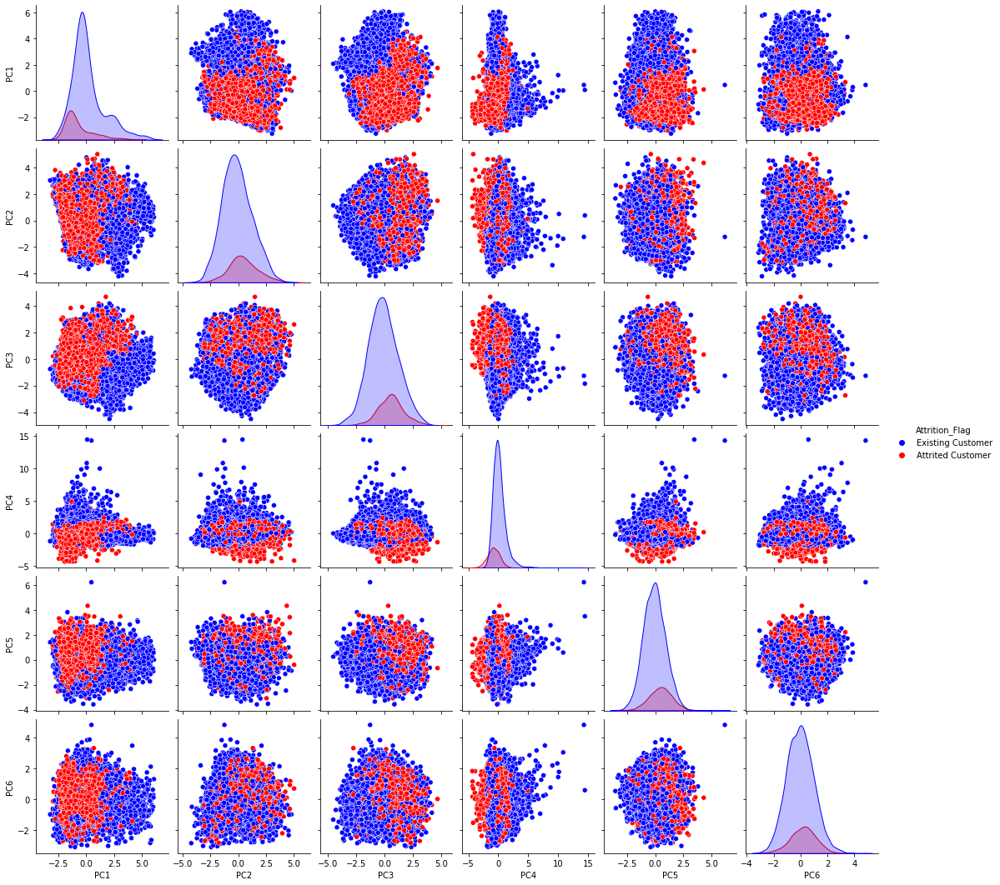

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

data = pd.read_csv("BANK CHURN ANALYSIS.csv")

selected_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']


X = data[selected_columns]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

n_components = 6
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_scaled)

principal_df = pd.DataFrame(data=principal_components, columns=[f"PC{i+1}" for i in range(n_components)])

explained_variance_ratio = pca.explained_variance_ratio_
for i, explained_variance in enumerate(explained_variance_ratio):
    print(f"PC{i+1}: {explained_variance*100:.2f}% explained variance")

all_data = pd.concat([principal_df, data["Attrition_Flag"]], axis=1)
sns.pairplot(all_data, hue="Attrition_Flag", palette={"Existing Customer": "blue", "Attrited Customer": "red"})
plt.show()


In [4]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN


data = pd.read_csv("BANK CHURN ANALYSIS.csv")

selected_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

X = data[selected_columns]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

eps = 0.5  
min_samples = 5  
dbscan = DBSCAN(eps=eps, min_samples=min_samples)


cluster_labels = dbscan.fit_predict(X_scaled)


num_outliers = len(cluster_labels[cluster_labels == -1])

print(f"Number of outliers: {num_outliers}")


Number of outliers: 10127


In [5]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import numpy as np

# Load the dataset
data = pd.read_csv("BANK CHURN ANALYSIS.csv")

# Assuming you want to use certain columns as features
selected_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

# Select the relevant columns from the dataset
X = data[selected_columns]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize K-means with an appropriate number of clusters (you can adjust this)
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

# Fit K-means to the standardized data and get cluster labels
cluster_labels = kmeans.fit_predict(X_scaled)

# Calculate the distances from each point to its cluster center
distances = np.zeros(X_scaled.shape[0])

for i in range(n_clusters):
    cluster_mask = (cluster_labels == i)
    cluster_center = kmeans.cluster_centers_[i]
    distances[cluster_mask] = np.linalg.norm(X_scaled[cluster_mask] - cluster_center, axis=1)

# Set a threshold for considering points as outliers (e.g., using percentile)
outlier_threshold = np.percentile(distances, 95)  # You can adjust the percentile

# Find and print the outliers
outliers = X[distances > outlier_threshold]
num_outliers = len(outliers)

print(f"Number of outliers: {num_outliers}")


C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Number of outliers: 507


C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the 

Optimal number of clusters: 2


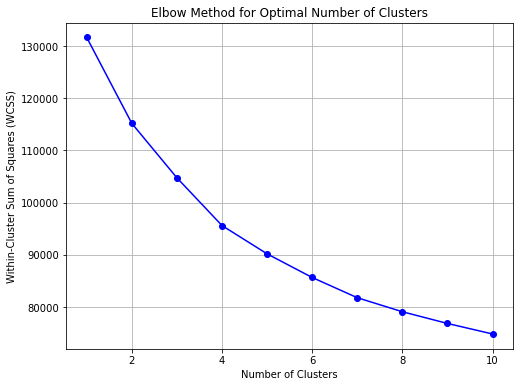

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Load the dataset
data = pd.read_csv("BANK CHURN ANALYSIS.csv")

# Assuming you want to use certain columns as features
selected_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

# Select the relevant columns from the dataset
X = data[selected_columns]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Determine the optimal number of clusters using the Elbow Method
inertia_values = []
possible_clusters = range(1, 11)  # You can adjust the range of clusters to consider

for n_clusters in possible_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow curve
plt.figure(figsize=(8, 6))
plt.plot(possible_clusters, inertia_values, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.grid(True)

# Find the optimal number of clusters (the "elbow" point)
optimal_clusters = None

# Let's find the "elbow" point by looking for the point of maximum curvature
deltas = np.diff(inertia_values, 2)
curvature = np.argmax(deltas) + 1  # Add 1 to account for the index shift due to diff()
optimal_clusters = possible_clusters[curvature]

# Print the optimal number of clusters
print(f"Optimal number of clusters: {optimal_clusters}")


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import numpy as np

# Load the dataset
data = pd.read_csv("BANK CHURN ANALYSIS.csv")

# Assuming you want to use certain columns as features
selected_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

# Select the relevant columns from the dataset
X = data[selected_columns]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



# Find the optimal number of clusters (the "elbow" point)
optimal_clusters = 6 # You should adjust this based on the plot

# Apply K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# Calculate the distances from each point to its cluster center
distances = np.zeros(X_scaled.shape[0])

for i in range(optimal_clusters):
    cluster_mask = (cluster_labels == i)
    cluster_center = kmeans.cluster_centers_[i]
    distances[cluster_mask] = np.linalg.norm(X_scaled[cluster_mask] - cluster_center, axis=1)

# Set a threshold for considering points as outliers (e.g., using percentile)
outlier_threshold = np.percentile(distances, 95)  # You can adjust the percentile

# Find and print the outliers
outliers = X[distances > outlier_threshold]
num_outliers = len(outliers)

print(f"Number of outliers: {num_outliers}")


C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Number of outliers: 507


In [9]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.covariance import MinCovDet
from scipy.stats import chi2
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("BANK CHURN ANALYSIS.csv")

# Assuming you want to use certain columns as features
selected_columns = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 
                    'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 
                    'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 
                    'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1']

# Select the relevant columns from the dataset
X = data[selected_columns]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize outlier detection methods
outliers = []

# 1. K-means Clustering with Elbow Method for Optimal Clusters
n_clusters = 4  # You can adjust the number of clusters
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)
distances = np.zeros(X_scaled.shape[0])

for i in range(n_clusters):
    cluster_mask = (cluster_labels == i)
    cluster_center = kmeans.cluster_centers_[i]
    distances[cluster_mask] = np.linalg.norm(X_scaled[cluster_mask] - cluster_center, axis=1)
outlier_threshold = np.percentile(distances, 95)
outliers.append(X[distances > outlier_threshold])


# Print the number of outliers for each method
method_names = [
    "K-means Clustering",
    
]

for i, method_name in enumerate(method_names):
    num_outliers = len(outliers[i])
    print(f"Number of outliers detected using {method_name}: {num_outliers}")


C:\Users\Lewnovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Number of outliers detected using K-means Clustering: 507


In [10]:
# Print all the detected outliers for each method
for i, method_name in enumerate(method_names):
    num_outliers = len(outliers[i])
    print(f"Number of outliers detected using {method_name}: {num_outliers}")
    
    # Print the outliers (if any) for the current method
    if num_outliers > 0:
        print(f"Outliers for {method_name}:")
        print(outliers[i])
        print("\n")


Number of outliers detected using K-means Clustering: 507
Outliers for K-means Clustering:
       Customer_Age  Dependent_count  Months_on_book  \
0                45                3              39   
1                49                5              44   
2                51                3              36   
3                40                4              34   
4                40                3              21   
...             ...              ...             ...   
10066            53                2              46   
10109            47                5              35   
10110            56                1              49   
10112            33                2              20   
10114            29                0              15   

       Total_Relationship_Count  Months_Inactive_12_mon  \
0                             5                       1   
1                             6                       1   
2                             4                       1   


In [22]:
oversample = SMOTE()
X, y = oversample.fit_resample(c_data[c_data.columns[1:]], c_data[c_data.columns[0]])
usampled_df = X.assign(Churn = y)

In [23]:
ohe_data =usampled_df[usampled_df.columns[15:-1]].copy()

usampled_df = usampled_df.drop(columns=usampled_df.columns[15:-1])

In [24]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =usampled_df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =usampled_df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations")
fig.show()


<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'>We will use principal component analysis to reduce the dimensionality of the one-hot encoded categorical variables losing some of the variances, but simultaneously, using a couple of principal components instead of tens of one-hot encoded features will help me construct a better model.</span></p>

In [25]:

N_COMPONENTS = 4

pca_model = PCA(n_components = N_COMPONENTS )

pc_matrix = pca_model.fit_transform(ohe_data)

evr = pca_model.explained_variance_ratio_
total_var = evr.sum() * 100
cumsum_evr = np.cumsum(evr)

trace1 = {
    "name": "individual explained variance", 
    "type": "bar", 
    'y':evr}
trace2 = {
    "name": "cumulative explained variance", 
    "type": "scatter", 
     'y':cumsum_evr}
data = [trace1, trace2]
layout = {
    "xaxis": {"title": "Principal components"}, 
    "yaxis": {"title": "Explained variance ratio"},
  }
fig = go.Figure(data=data, layout=layout)
fig.update_layout(     title='Explained Variance Using {} Dimensions'.format(N_COMPONENTS))
fig.show()

In [26]:
usampled_df_with_pcs = pd.concat([usampled_df,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

In [27]:
fig = ex.scatter_matrix(
    usampled_df_with_pcs[['PC-{}'.format(i) for i in range(0,N_COMPONENTS)]].values,
    color=usampled_df_with_pcs.Credit_Limit,
    dimensions=range(N_COMPONENTS),
    labels={str(i):'PC-{}'.format(i) for i in range(0,N_COMPONENTS)},
    title=f'Total Explained Variance: {total_var:.2f}%')

fig.update_traces(diagonal_visible=False)
fig.update_layout(
    coloraxis_colorbar=dict(
        title="Credit_Limit",
    ),
)
fig.show()

In [28]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))


s_val =usampled_df_with_pcs.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =usampled_df_with_pcs.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations With PC\'s")
fig.show()



In [29]:
X_features = ['Total_Trans_Ct','PC-3','PC-1','PC-0','PC-2','Total_Ct_Chng_Q4_Q1','Total_Relationship_Count']

X = usampled_df_with_pcs[X_features]
y = usampled_df_with_pcs['Churn']

In [30]:
train_x,test_x,train_y,test_y = train_test_split(X,y,random_state=42)

In [31]:
rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42)) ])
ada_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",AdaBoostClassifier(random_state=42,learning_rate=0.7)) ])
svm_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",SVC(random_state=42,kernel='rbf')) ])


f1_cross_val_scores = cross_val_score(rf_pipe,train_x,train_y,cv=5,scoring='f1')
ada_f1_cross_val_scores=cross_val_score(ada_pipe,train_x,train_y,cv=5,scoring='f1')
svm_f1_cross_val_scores=cross_val_score(svm_pipe,train_x,train_y,cv=5,scoring='f1')

In [32]:
fig = make_subplots(rows=3, cols=1,shared_xaxes=True,subplot_titles=('Random Forest Cross Val Scores',
                                                                     'Adaboost Cross Val Scores',
                                                                    'SVM Cross Val Scores'))

fig.add_trace(
    go.Scatter(x=list(range(0,len(f1_cross_val_scores))),y=f1_cross_val_scores,name='Random Forest'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(ada_f1_cross_val_scores))),y=ada_f1_cross_val_scores,name='Adaboost'),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(svm_f1_cross_val_scores))),y=svm_f1_cross_val_scores,name='SVM'),
    row=3, col=1
)

fig.update_layout(height=700, width=900, title_text="Different Model 5 Fold Cross Validation")
fig.update_yaxes(title_text="F1 Score")
fig.update_xaxes(title_text="Fold #")

fig.show()

In [33]:
rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

ada_pipe.fit(train_x,train_y)
ada_prediction = ada_pipe.predict(test_x)

svm_pipe.fit(train_x,train_y)
svm_prediction = svm_pipe.predict(test_x)

In [34]:
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>', '<b>F1 Score On Test Data<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Random Forest<b>', '<b>AdaBoost<b>','<b>SVM<b>'], [np.round(f1(rf_prediction,test_y),2), 
                                                                          np.round(f1(ada_prediction,test_y),2),
                                                                          np.round(f1(svm_prediction,test_y),2)]]))
                     ])

fig.update_layout(title='Model Results On Test Data')
fig.show()

In [35]:
ohe_data =c_data[c_data.columns[16:]].copy()
pc_matrix = pca_model.fit_transform(ohe_data)
original_df_with_pcs = pd.concat([c_data,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

unsampled_data_prediction_RF = rf_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_ADA = ada_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_SVM = svm_pipe.predict(original_df_with_pcs[X_features])

In [36]:
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>', '<b>F1 Score On Original Data (Before Upsampling)<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Random Forest<b>', '<b>AdaBoost<b>','<b>SVM<b>'], [np.round(f1(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag']),2), 
                                                                          np.round(f1(unsampled_data_prediction_ADA,original_df_with_pcs['Attrition_Flag']),2),
                                                                          np.round(f1(unsampled_data_prediction_SVM,original_df_with_pcs['Attrition_Flag']),2)]]))
                     ])

fig.update_layout(title='Model Result On Original Data (Without Upsampling)')
fig.show()

In [37]:
z=confusion_matrix(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag'])
fig = ff.create_annotated_heatmap(z, x=['Not Churn','Churn'], y=['Predicted Not Churn','Predicted Churn'], colorscale='Fall',xgap=3,ygap=3)
fig['data'][0]['showscale'] = True
fig.update_layout(title='Prediction On Original Data With Random Forest Model Confusion Matrix')
fig.show()

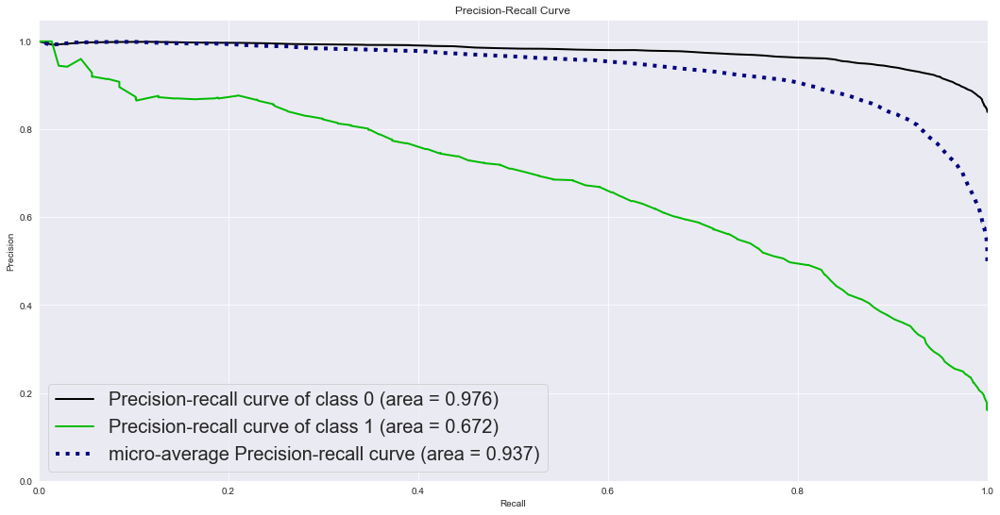

In [38]:
unsampled_data_prediction_RF = rf_pipe.predict_proba(original_df_with_pcs[X_features])
skplt.metrics.plot_precision_recall(original_df_with_pcs['Attrition_Flag'], unsampled_data_prediction_RF)
plt.legend(prop={'size': 20})